In [1]:
import os
import numpy as np
import random
import cv2
import matplotlib.pyplot as plt

In [2]:
os.listdir("D:/3xM/3xM_Dataset_80_80")

['depth', 'mask', 'rgb']

In [3]:
def gray_mask_to_binary_mask(mask, bg_value=1):
    # get objects in masks
    obj_ids = np.unique(mask)
    obj_ids = obj_ids[obj_ids != bg_value]

    # Create List of Binary Masks
    masks = np.zeros((len(obj_ids), mask.shape[0], mask.shape[1]), dtype=np.uint8)

    for i, obj_id in enumerate(obj_ids):
        if obj_id == bg_value:  # Background
            continue
        masks[i] = (mask == obj_id).astype(np.uint8)

    return masks # np.transpose(masks, (1, 0, 2))

def transform_mask(mask, one_dimensional=False, input_color_map=None):

    if one_dimensional:
        dimensions = 1
    else:
        dimensions = 3

    if input_color_map and len(input_color_map[0]) != dimensions:
        raise ValueError(f"Dimension of Input Colormap {len(input_color_map[0])} doesn't fit to used dimensions: {dimensions}")

    color_map = []

    # convert mask map to color image
    color_image = np.zeros((mask.shape[0], mask.shape[1], dimensions), dtype=np.uint8)

    # assign a random color to each object and skip the background
    unique_values = np.unique(mask)
    idx = 0
    for value in unique_values:
        if value != 0:
            if input_color_map:
                color = input_color_map[idx]
            else:
                if dimensions == 3:
                    color = (np.random.randint(0, 255), np.random.randint(0, 255), np.random.randint(0, 255))
                else:
                    color = (np.random.randint(20, 255))
            color_image[mask == value] = color
            color_map += [color]
            idx += 1
    return color_image, color_map

In [9]:
def vis_example(data_path, width=20, height=15, bg_value=1,
                rgb_name="rgb", depth_name="depth", mask_name="mask"):
    rgb_path = os.path.join(data_path, rgb_name)
    img_id = random.choice(os.listdir(rgb_path))
    
    rgb = cv2.imread(os.path.join(data_path, rgb_name, img_id))
    depth = cv2.imread(os.path.join(data_path, depth_name, img_id), cv2.IMREAD_UNCHANGED)
    if len(depth.shape) > 2:
        depth = cv2.split(depth)[1]
    mask = cv2.imread(os.path.join(data_path, mask_name, img_id), cv2.IMREAD_UNCHANGED)
    if mask is not None:
        mask[mask == bg_value] = 0
        color_image, color_map = transform_mask(mask, one_dimensional=False)
        # rgb_masks = extract_and_visualize_mask(masks, image=None, ax=ax[2], visualize=True, color_map=None, soft_join=False)

    if mask is not None:
        cols = 3
    else:
        cols = 2
        
    fig, ax = plt.subplots(nrows=1, ncols=cols, figsize=(width, height))
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.05, hspace=0.05)
    #plt.suptitle(f"Image Example: '{img_id}'")

    ax[0].imshow(cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB))
    ax[0].set_title("RGB Input Image")
    ax[0].axis("off")

    ax[1].imshow(depth, cmap="gray")
    ax[1].set_title("Depth Input Image")
    ax[1].axis("off")

    if mask is not None:
        ax[2].imshow(color_image)# , cmap="gray")
        ax[2].set_title("Mask Ground Truth")
        ax[2].axis("off")

    plt.show()

In [ ]:
vis_example("D:/3xM/3xM_Dataset_80_80")

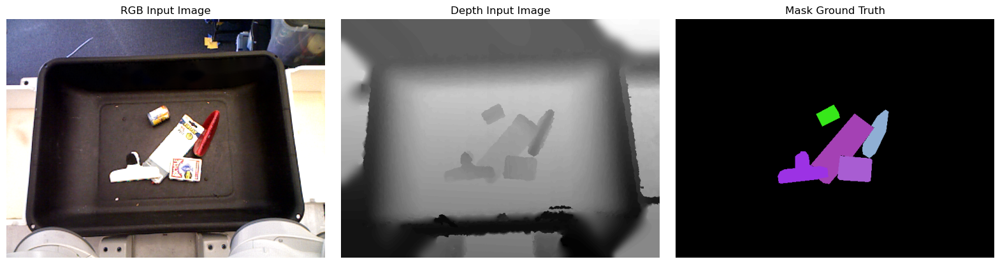

In [18]:
vis_example("D:/3xM/wisdom/wisdom-real/low-res", rgb_name="color_ims", depth_name="depth_ims", mask_name="modal_segmasks", bg_value=0)

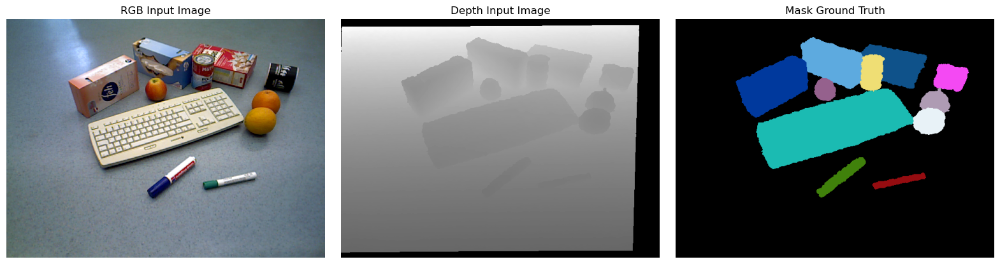

In [35]:
vis_example("D:/3xM/3xM_Test_Dataset/OCID-dataset-prep", bg_value=1)

Cur Dataset: 3xM_Bias_Experiment


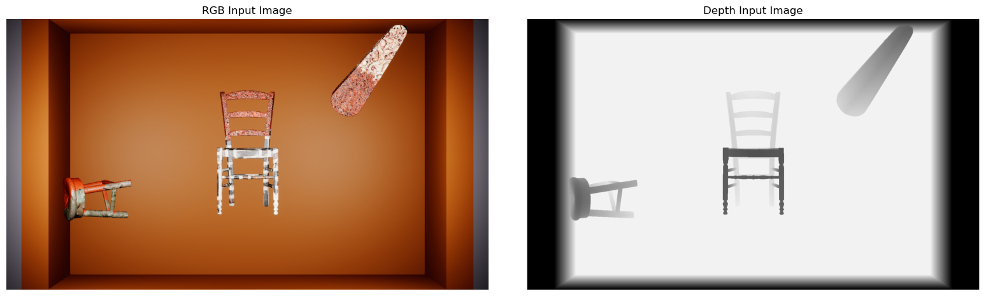

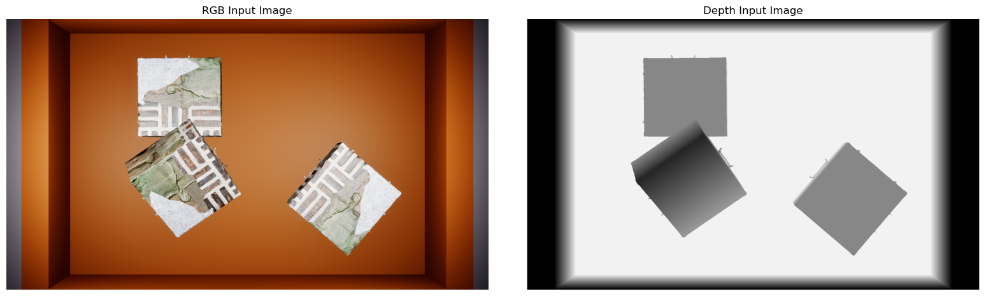

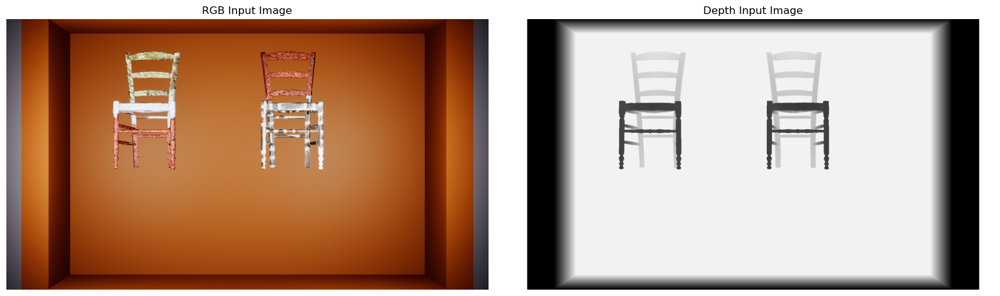

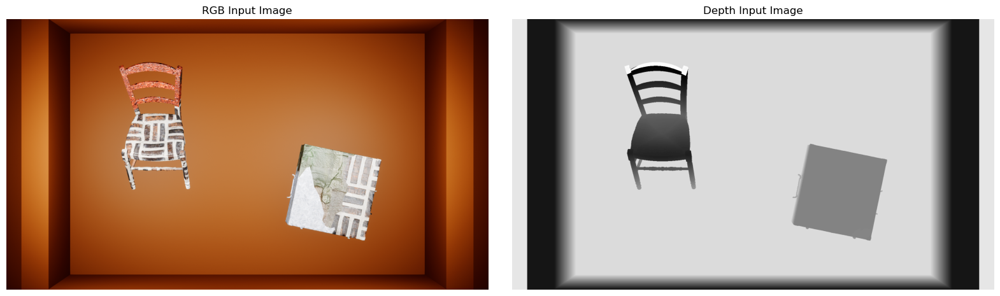

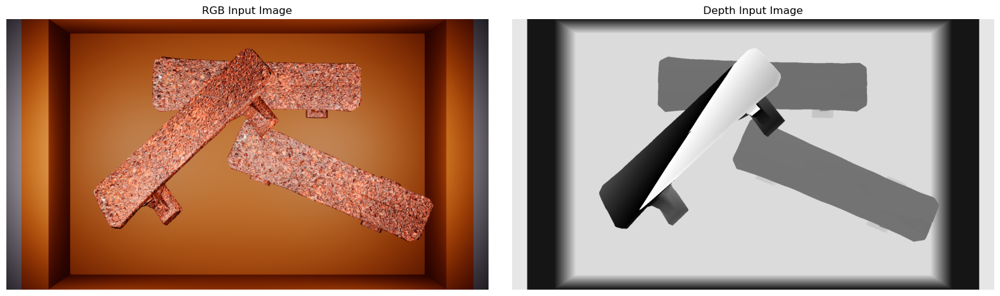

...

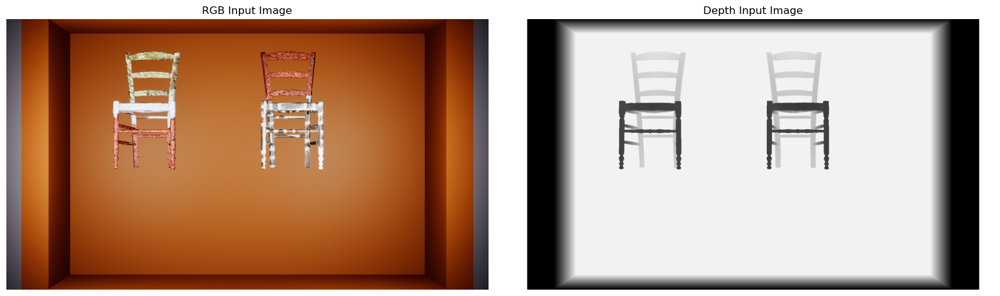

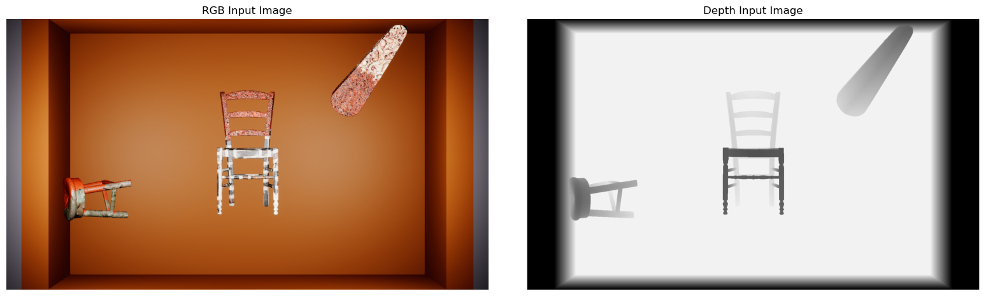

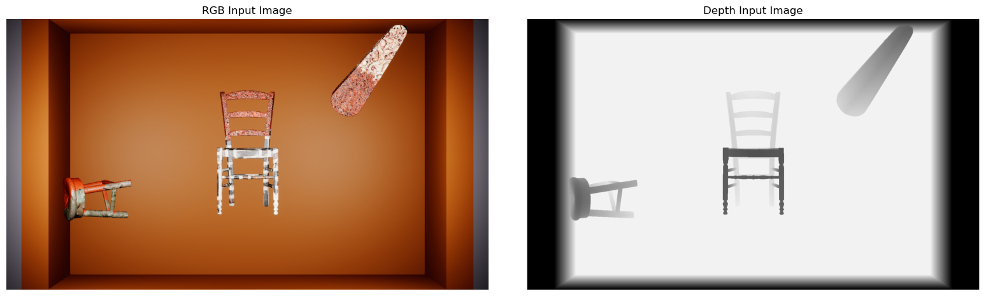

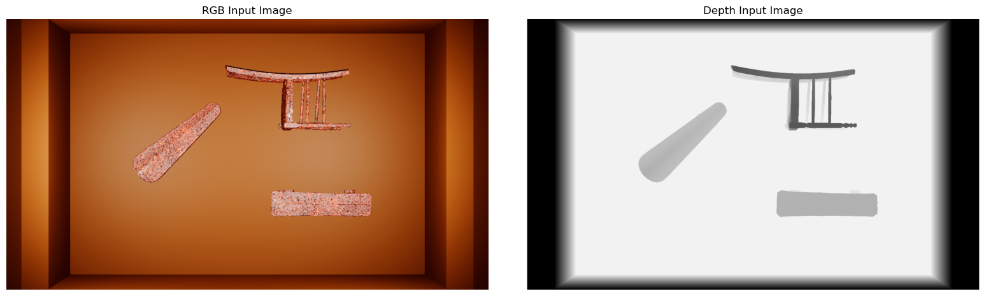

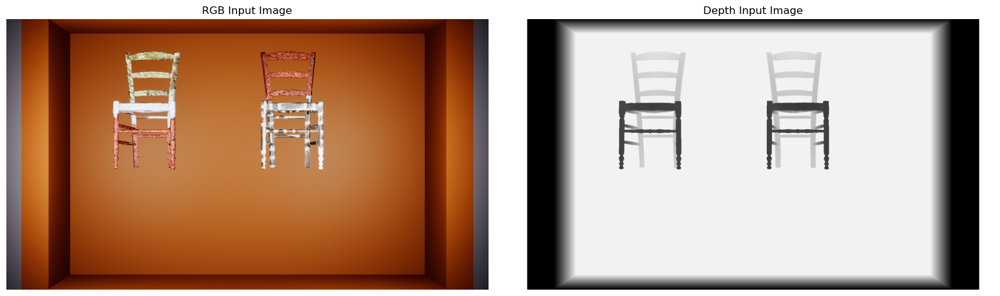

Cur Dataset: 3xM_Test_Dataset_known_known


<Figure size 640x480 with 0 Axes>

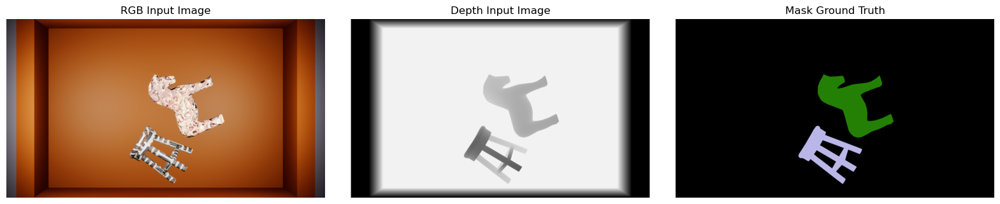

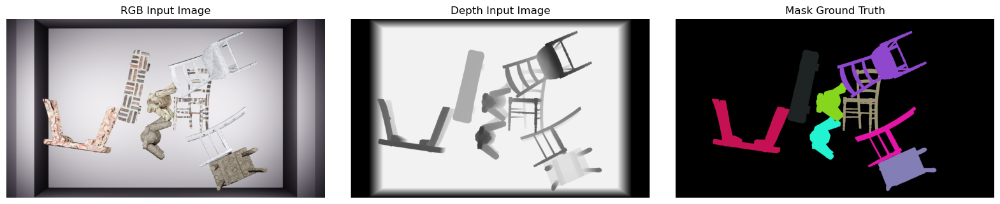

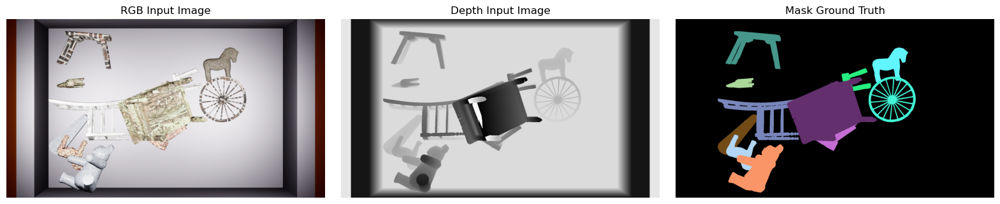

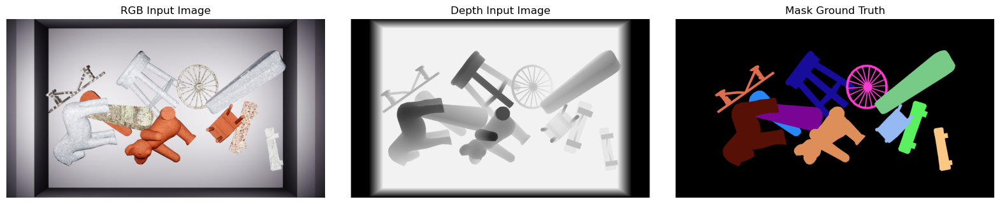

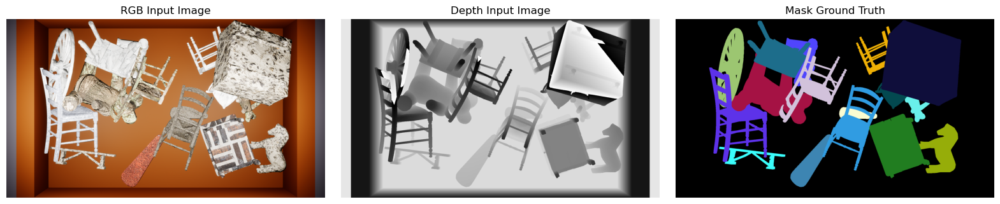

Cur Dataset: 3xM_Test_Dataset_known_unknown


<Figure size 640x480 with 0 Axes>

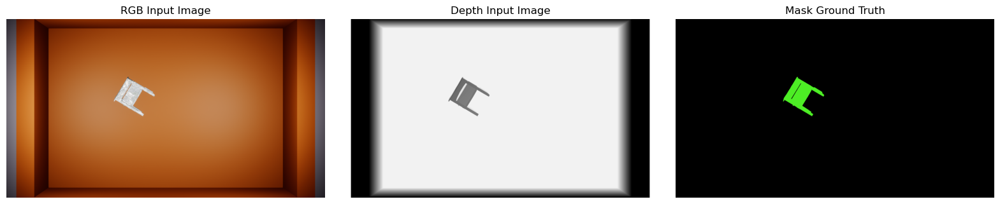

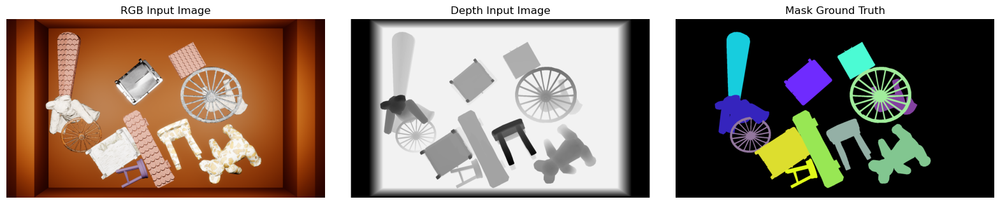

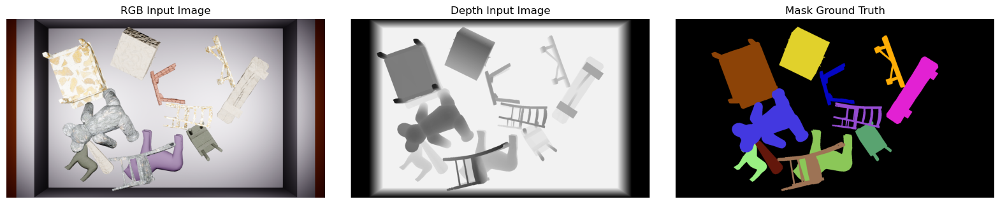

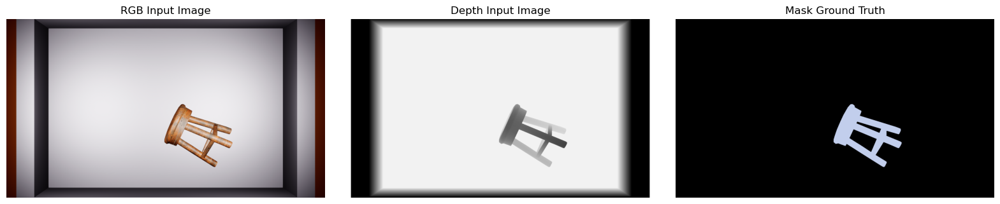

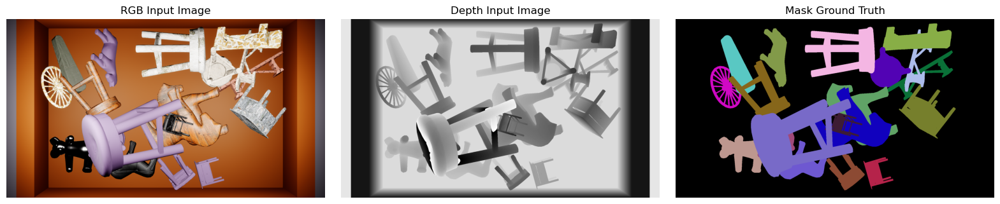

Cur Dataset: 3xM_Test_Dataset_unknown_known


<Figure size 640x480 with 0 Axes>

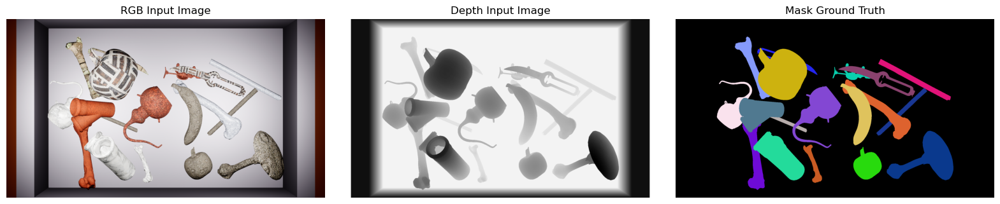

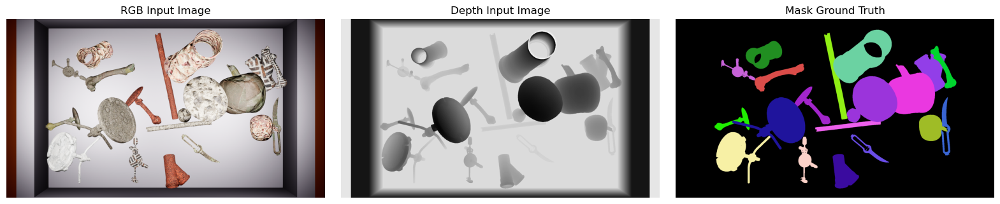

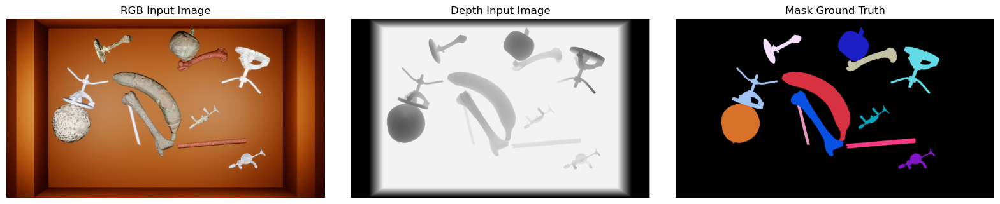

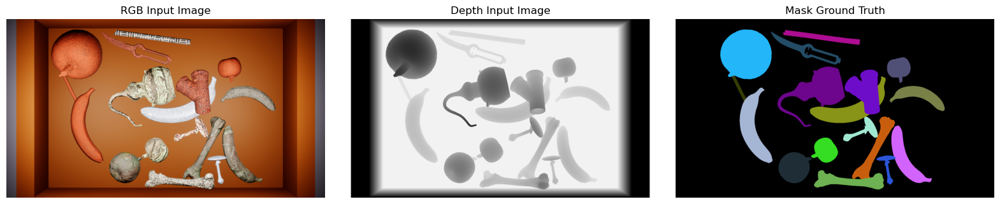

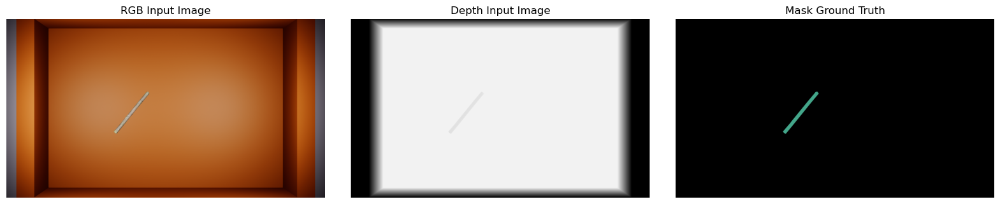

Cur Dataset: 3xM_Test_Dataset_unknown_unknown


<Figure size 640x480 with 0 Axes>

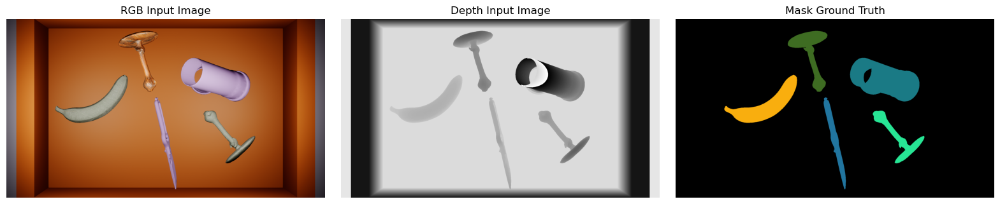

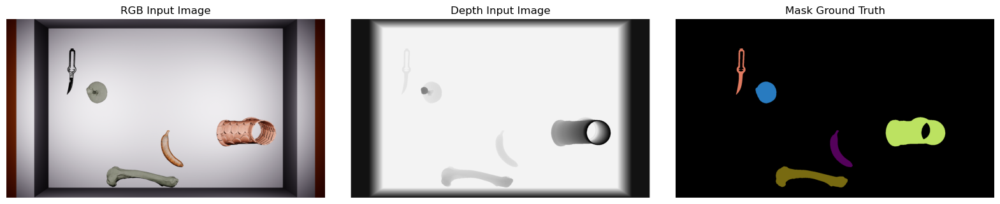

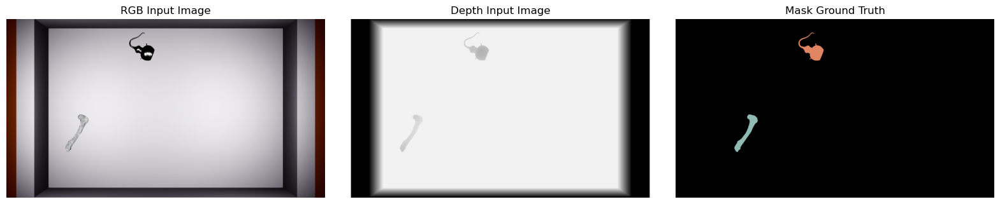

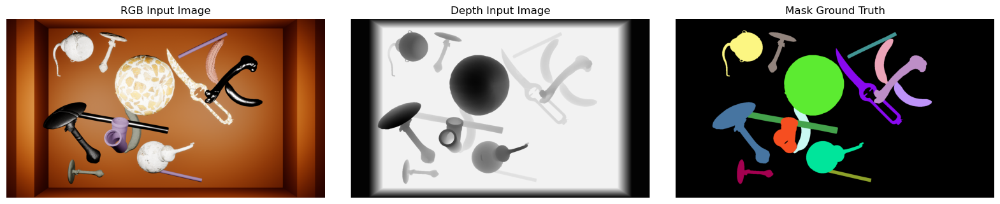

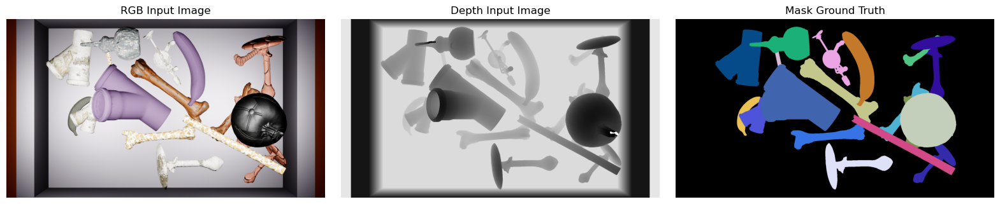

Cur Dataset: OCID-dataset-prep


<Figure size 640x480 with 0 Axes>

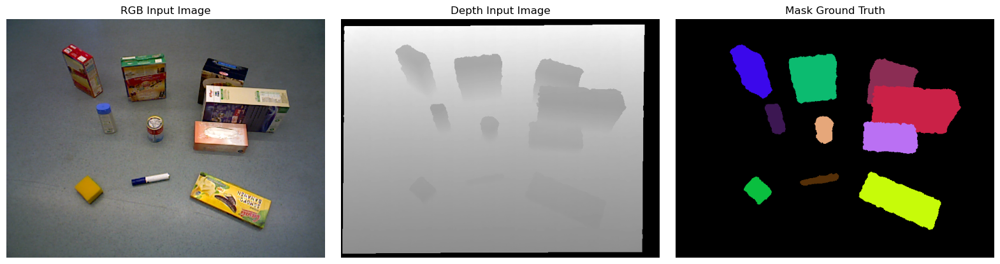

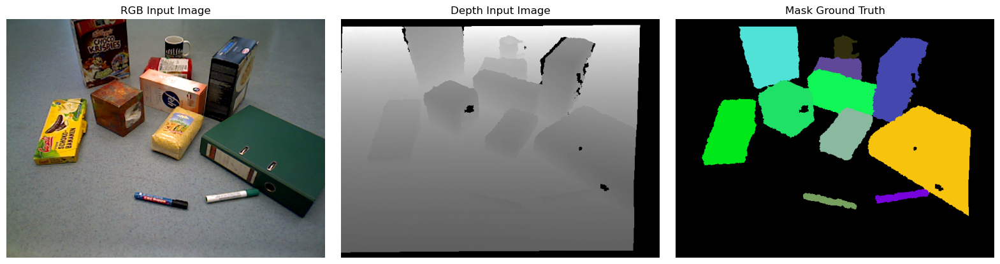

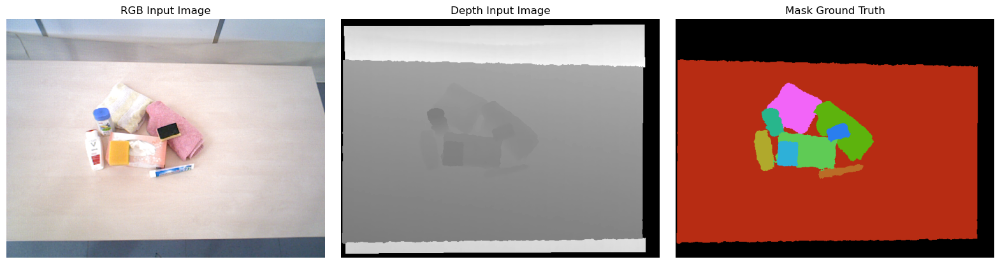

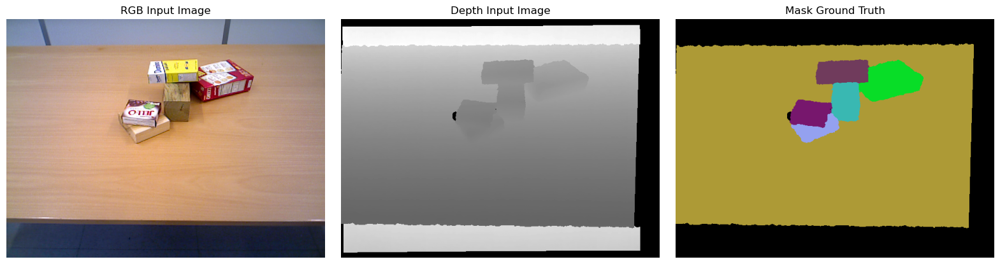

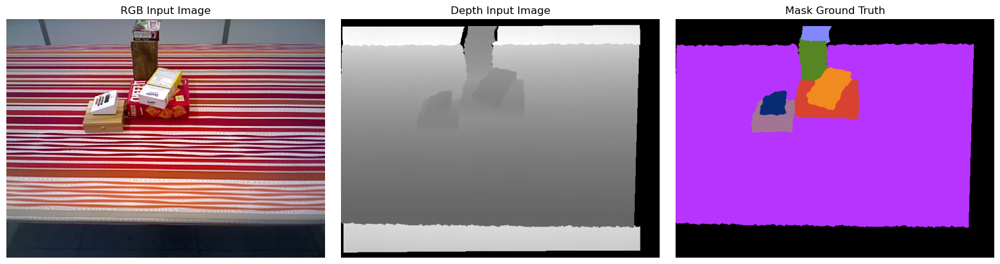

<Figure size 640x480 with 0 Axes>

In [7]:
for cur_dir in os.listdir("D:/3xM/3xM_Test_Dataset"):

    print(f"Cur Dataset: {cur_dir}")
    
    if cur_dir == "3xM_Bias_Experiment":
        range_n = 20
    else:
        range_n = 5
    for i in range(range_n):
        vis_example(os.path.join("D:/3xM/3xM_Test_Dataset", cur_dir))
    
    # input("Ready to continue?:")
    # plt.clf()

In [2]:
def auto_edge_detection(image, sigma=0.33):
        """
        Creates a edge image from a gray or RGB image with Canny edge detection.

        Parameters:
        -----------
        image (np.Array): Gray or RGB image where the edges will be detected
        sigma (float): Parameter for Canny Edge Detection lower and upper values. Setting boundaries with the median and sigma value.

        Returns:
        --------
        tuple: A tuple containing:
            - Image (np.Array): the gray input image
            - Image (np.Array): the edge image
        """
        if len(image.shape) > 2:
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        else:
            gray = image
        
        # Compute the median of the pixel intensities
        v = np.median(gray)
        
        # Set lower and upper bounds for Canny thresholds, with auto-adjustment based on median
        lower = int(max(0, (1.0 - sigma) * v))
        upper = int(min(255, (1.0 + sigma) * v))
        
        # Apply the Canny edge detector with auto-calculated thresholds
        edges = cv2.Canny(gray, lower, upper)
        
        return gray, edges

In [4]:
os.listdir("D:/3xM/3xM_Test_Dataset/3xM_Bias_Experiment/rgb")

['3xM_0_0_0.png',
 '3xM_1_0_0.png',
 '3xM_2_0_0.png',
 '3xM_3_0_0.png',
 '3xM_4_0_0.png',
 '3xM_5_0_0.png',
 '3xM_6_0_0.png']

In [5]:
img_id = "3xM_0_0_0.png"

In [15]:
depth = cv2.split(cv2.imread("D:/3xM/3xM_Test_Dataset/3xM_Bias_Experiment/depth/3xM_2_0_0.png", cv2.IMREAD_UNCHANGED))
depth = depth[1]
depth

array([[229, 229, 229, ..., 229, 229, 229],
       [229, 229, 229, ..., 229, 229, 229],
       [229, 229, 229, ..., 229, 229, 229],
       ...,
       [229, 229, 229, ..., 229, 229, 229],
       [229, 229, 229, ..., 229, 229, 229],
       [229, 229, 229, ..., 229, 229, 229]], dtype=uint8)

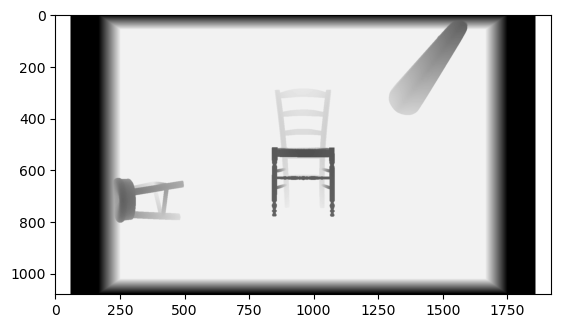

In [16]:
plt.imshow(depth, cmap="gray")

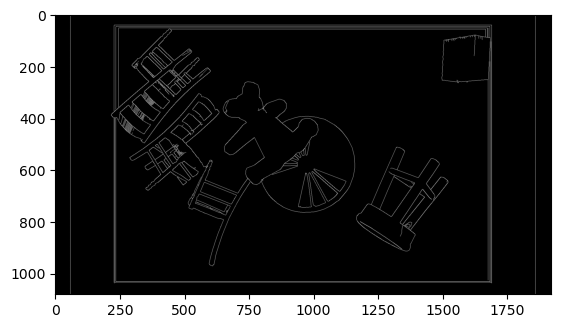

In [14]:
plt.imshow(auto_edge_detection(depth, sigma=1.0)[1], cmap="gray")

In [7]:
rgb = cv2.imread("D:/3xM/3xM_Dataset_10_160/rgb/3xM_0_10_160.png")
rgb

array([[[ 0,  4, 40],
        [ 0,  4, 40],
        [ 0,  5, 41],
        ...,
        [ 0,  3, 32],
        [ 0,  2, 31],
        [ 1,  3, 32]],

       [[ 0,  4, 40],
        [ 0,  4, 40],
        [ 0,  4, 41],
        ...,
        [ 0,  3, 32],
        [ 1,  3, 32],
        [ 0,  2, 31]],

       [[ 0,  5, 41],
        [ 0,  5, 41],
        [ 0,  5, 41],
        ...,
        [ 0,  2, 32],
        [ 0,  3, 32],
        [ 0,  3, 32]],

       ...,

       [[ 0,  4, 41],
        [ 0,  4, 41],
        [ 0,  5, 42],
        ...,
        [ 0,  3, 33],
        [ 0,  3, 33],
        [ 1,  4, 33]],

       [[ 0,  4, 40],
        [ 0,  5, 41],
        [ 0,  4, 41],
        ...,
        [ 0,  3, 32],
        [ 0,  3, 32],
        [ 0,  3, 32]],

       [[ 0,  3, 39],
        [ 0,  5, 41],
        [ 0,  4, 40],
        ...,
        [ 0,  3, 32],
        [ 0,  3, 31],
        [ 0,  3, 31]]], dtype=uint8)

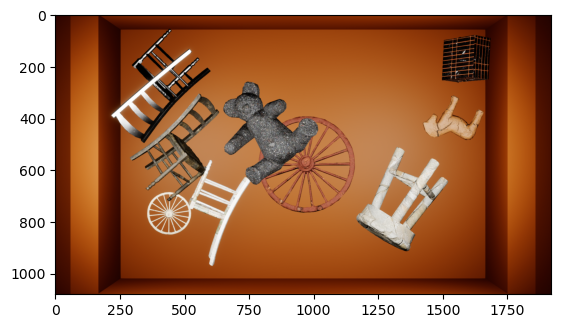

In [8]:
plt.imshow(cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB))

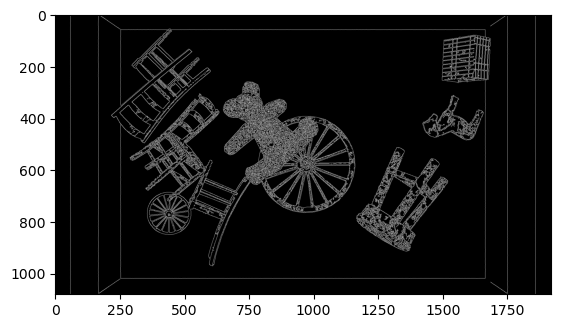

In [22]:
plt.imshow(auto_edge_detection(rgb, sigma=0.82)[1], cmap="gray")